# CS 363M Machine Learning Project
#### By Tejas Oberoi, Mukund Raman, and Rohith Karthikeyan

## Step 0: Load Data

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# View initial 20 rows of data
df = pd.read_csv('cattle_data_train.csv')
test_df = pd.read_csv('cattle_data_test.csv')
df.head(20)

,Cattle_ID,Breed,Climate_Zone,Management_System,Age_Months,Weight_kg,Parity,Lactation_Stage,Days_in_Milk,Feed_Type,...,BVD_Vaccine,Rabies_Vaccine,Previous_Week_Avg_Yield,Body_Condition_Score,Milking_Interval_hrs,Date,Farm_ID,Feed_Quantity_lb,Mastitis,Milk_Yield_L
0,CATTLE_133713,Holstein,Tropical,Intensive,114,544.8,4,Mid,62,Concentrates,...,0,1,6.31,3.0,12,2024-01-15,FARM_0301,36.8235,1,12.192634
1,CATTLE_027003,Holstein,Arid,Mixed,136,298.9,4,Mid,213,Crop_Residues,...,0,0,17.16,4.0,12,2023-10-31,FARM_0219,NaN,0,14.717031
2,CATTLE_122459,Holstein,Tropical,Semi_Intensive,64,336.6,4,Late,16,Hay,...,1,0,4.07,3.5,12,2024-05-20,FARM_0802,16.0965,0,14.006142
3,CATTLE_213419,Jersey,Mediterranean,Intensive,58,370.5,1,Early,339,Crop_Residues,...,0,0,10.23,3.0,24,2024-07-22,FARM_0034,40.7925,0,24.324325
4,CATTLE_106260,Guernsey,Subtropical,Intensive,84,641.5,6,Early,125,Mixed_Feed,...,1,1,20.68,3.0,12,2023-01-03,FARM_0695,33.7365,1,12.023074
5,CATTLE_090774,Jersey,Continental,Pastoral,50,464.3,5,Late,174,Hay,...,1,0,7.48,3.5,12,2022-10-01,FARM_0766,31.5315,0,20.736971
6,CATTLE_029380,Guernsey,Mediterranean,Pastoral,67,422.3,6,Late,263,Silage,...,1,0,3.58,3.5,8,2024-03-21,FARM_0114,23.1525,0,12.722306
7,CATTLE_081978,Guernsey,Tropical,Pastoral,71,582.7,3,Mid,53,Dry_Fodder,...,0,1,5.14,3.0,12,2024-06-01,FARM_0120,24.4755,0,13.440506
8,CATTLE_167633,Brown Swiss,Arid,Pastoral,98,540.3,6,Early,34,Hay,...,0,1,11.04,4.0,12,2024-09-18,FARM_0303,31.3110,0,14.938699
9,CATTLE_021443,Holstein,Tropical,Mixed,40,382.9,6,Mid,352,Pasture_Grass,...,1,0,2.48,3.5,12,2023-04-24,FARM_0584,23.8140,1,7.961243


### Step 1: Data Exploration (**Note, skip to Section 3 if you want to run our models since all preprocessing/model running is done in Section 3, Sections 1/2 are just our brainstorming/exploration/deciding what features to modify in Section 3**)

### Step 1.1: Unique Values

From this, we can tell that the column 'Breed' has a misspelled 'Holstein' column, and that there are three versions of 'Brown Swiss', so whitespace needs to be removed from some values.

In [ ]:
# View all columns and the number of rows in training data
print(df.columns)
print(len(df))

# Define categorical features
categorical_features = [
    'Breed', 'Climate_Zone', 'Management_System', 'Lactation_Stage',
    'Feed_Type', 'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine',
    'BQ_Vaccine', 'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine',
    'Rabies_Vaccine', 'Mastitis'
]

# View all the unique values for each categorical column
print(df.nunique())
for column in categorical_features:
    unique_values = df[column].unique()
    print(f"Unique values in column '{column}': {unique_values}")

Index(['Cattle_ID', 'Breed', 'Climate_Zone', 'Management_System', 'Age_Months',
       'Weight_kg', 'Parity', 'Lactation_Stage', 'Days_in_Milk', 'Feed_Type',
       'Feed_Quantity_kg', 'Feeding_Frequency', 'Water_Intake_L',
       'Walking_Distance_km', 'Grazing_Duration_hrs', 'Rumination_Time_hrs',
       'Resting_Hours', 'Ambient_Temperature_C', 'Humidity_percent',
       'Housing_Score', 'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine',
       'BQ_Vaccine', 'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine',
       'Rabies_Vaccine', 'Previous_Week_Avg_Yield', 'Body_Condition_Score',
       'Milking_Interval_hrs', 'Date', 'Farm_ID', 'Feed_Quantity_lb',
       'Mastitis', 'Milk_Yield_L'],
      dtype='object')
210000
Cattle_ID                  209966
Breed                           7
Climate_Zone                    6
Management_System               5
Age_Months                    120
Weight_kg                    5001
Parity                          6
Lactation_Stage                 3
D

### STEP 1.2: Mutual Information Scores

Now, we will compute "information scores" for each feature to see which could be useless.

From these results, we can see that the relatively high information columns are the age in months, weight in kgs, parity, feed quantity in lbs/kgs, days in milk, mastitis, and water intake in liters. After this, the scores drop off significantly and show that the rest of the columns may not be as useful in predicting the target.

193600
36

=== Mutual Information Scores (Ranked) ===

                Feature  MI_Score Feature_Type
             Age_Months  0.058255   Continuous
              Weight_kg  0.049129   Continuous
                 Parity  0.029557   Continuous
       Feed_Quantity_lb  0.027022   Continuous
       Feed_Quantity_kg  0.025375   Continuous
           Days_in_Milk  0.014321   Continuous
               Mastitis  0.007428  Categorical
         Water_Intake_L  0.007070   Continuous
        Lactation_Stage  0.003553  Categorical
Previous_Week_Avg_Yield  0.002707   Continuous
    Rumination_Time_hrs  0.002674   Continuous
    Walking_Distance_km  0.002631   Continuous
        Anthrax_Vaccine  0.002441  Categorical
            IBR_Vaccine  0.001605  Categorical
      Feeding_Frequency  0.001478   Continuous
         Rabies_Vaccine  0.001378  Categorical
   Body_Condition_Score  0.001356   Continuous
              Feed_Type  0.001273  Categorical
  Ambient_Temperature_C  0.001061   Continuous
   Mi

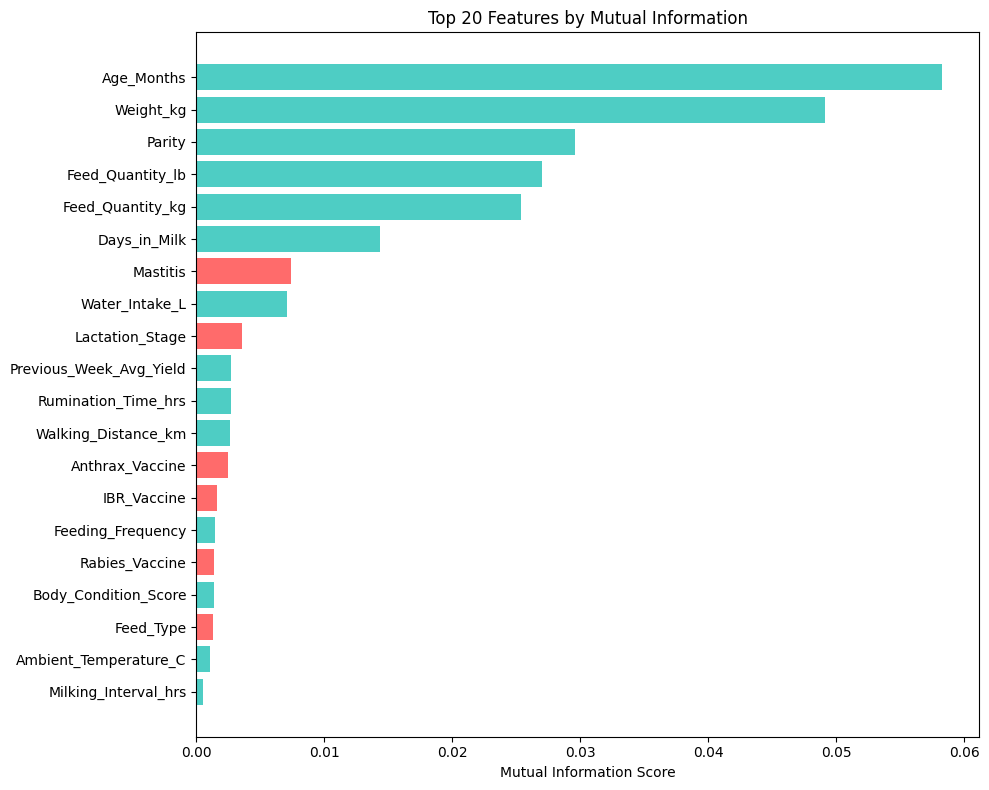


=== Summary ===
Total features analyzed: 32
Features with MI > 0.1: 0
Features with MI > 0.05: 1
Features with MI < 0.01: 26 (consider removing)


In [ ]:
from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import LabelEncoder

# As a first step, drop all rows with missing values and
# view the new number of rows
df.dropna(inplace=True)
print(len(df))
print(len(df.columns))

# Features to exclude (ID columns, date, and target)
exclude_features = ['Cattle_ID', 'Farm_ID', 'Date', 'Milk_Yield_L']

# Get feature columns
feature_cols = [col for col in df.columns if col not in exclude_features]

# Prepare data
X = df[feature_cols].copy()
y = df['Milk_Yield_L']

# Label encode categorical features
X_encoded = X.copy()
for col in categorical_features:
    if col in X_encoded.columns:
        le = LabelEncoder()
        X_encoded[col] = le.fit_transform(X[col].astype(str))

# Create discrete_features mask
discrete_mask = [col in categorical_features for col in feature_cols]

# Calculate mutual information
mi_scores = mutual_info_regression(
    X_encoded,
    y,
    discrete_features=discrete_mask,
    random_state=42,
    n_neighbors=5
)

# Create results dataframe
mi_results = pd.DataFrame({
    'Feature': feature_cols,
    'MI_Score': mi_scores,
    'Feature_Type': ['Categorical' if col in categorical_features else 'Continuous'
                     for col in feature_cols]
}).sort_values('MI_Score', ascending=False)

print("\n=== Mutual Information Scores (Ranked) ===\n")
print(mi_results.to_string(index=False))

# Visualize top 20 features
plt.figure(figsize=(10, 8))
top_20 = mi_results.head(20)
colors = ['#FF6B6B' if ft == 'Categorical' else '#4ECDC4'
          for ft in top_20['Feature_Type']]
plt.barh(range(len(top_20)), top_20['MI_Score'], color=colors)
plt.yticks(range(len(top_20)), top_20['Feature'])
plt.xlabel('Mutual Information Score')
plt.title('Top 20 Features by Mutual Information')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Print summary statistics
print(f"\n=== Summary ===")
print(f"Total features analyzed: {len(feature_cols)}")
print(f"Features with MI > 0.1: {(mi_scores > 0.1).sum()}")
print(f"Features with MI > 0.05: {(mi_scores > 0.05).sum()}")
print(f"Features with MI < 0.01: {(mi_scores < 0.01).sum()} (consider removing)")

### Step 1.3: Chi-Square Statistic

Perform a Chi-Square test for the categorical features and view the results.

From this test, we can see that the only 5 statistically significant features are mastitis, lactation stage, whether IBR vaccine was taken, whether Anthrax vaccine was taken, and whether rabies vaccine was taken.

=== Chi-Square Test for Categorical Features ===

            Feature  Chi2_Statistic       P_Value  Degrees_of_Freedom Significant
           Mastitis     2731.272383  0.000000e+00                   3         Yes
    Lactation_Stage     1418.421478 2.485621e-303                   6         Yes
        IBR_Vaccine      952.692092 3.291640e-206                   3         Yes
    Anthrax_Vaccine      823.073827 4.285244e-178                   3         Yes
     Rabies_Vaccine      782.450718 2.768266e-169                   3         Yes
          Feed_Type       29.073418  1.122500e-01                  21          No
       Climate_Zone       21.115978  1.331645e-01                  15          No
              Breed       20.130838  3.255019e-01                  18          No
  Management_System        7.545980  8.195288e-01                  12          No
         HS_Vaccine        4.029365  2.583107e-01                   3          No
Brucellosis_Vaccine        2.646673  4.493659e-0

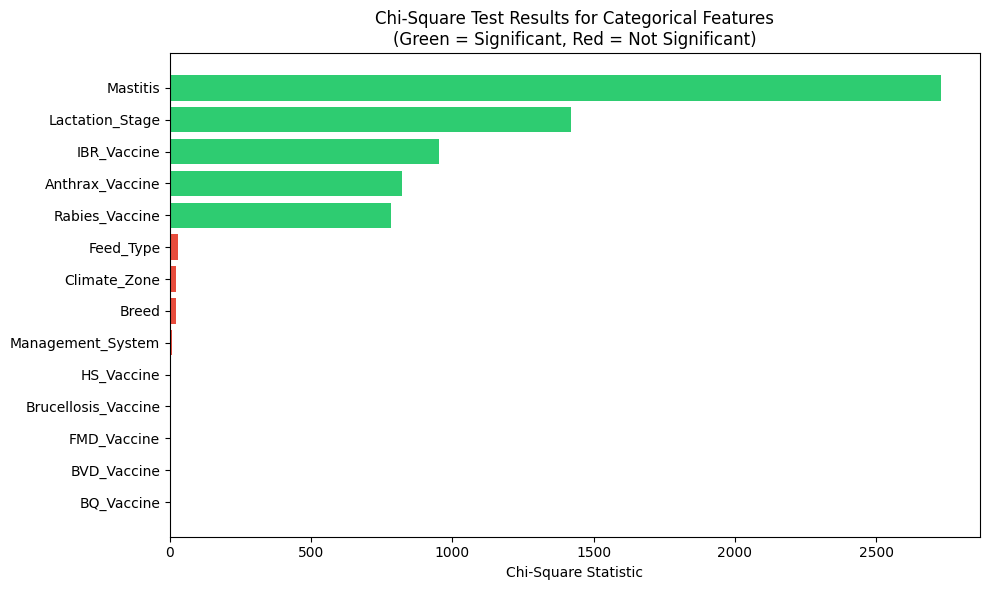

In [ ]:
from scipy.stats import chi2_contingency

# Define categorical features
categorical_features = [
    'Breed', 'Climate_Zone', 'Management_System', 'Lactation_Stage',
    'Feed_Type', 'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine',
    'BQ_Vaccine', 'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine',
    'Rabies_Vaccine', 'Mastitis'
]

# Target variable
y = df['Milk_Yield_L']

# Bin the continuous target into categories (quartiles)
y_binned = pd.qcut(y, q=4, labels=['Low', 'Medium-Low', 'Medium-High', 'High'])

print("=== Chi-Square Test for Categorical Features ===\n")

chi_square_results = []

for col in categorical_features:
    if col in df.columns:
        # Create contingency table
        contingency_table = pd.crosstab(df[col], y_binned)

        # Perform chi-square test
        chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)

        chi_square_results.append({
            'Feature': col,
            'Chi2_Statistic': chi2_stat,
            'P_Value': p_value,
            'Degrees_of_Freedom': dof,
            'Significant': 'Yes' if p_value < 0.05 else 'No'
        })

# Create results dataframe
chi2_df = pd.DataFrame(chi_square_results).sort_values('Chi2_Statistic', ascending=False)

print(chi2_df.to_string(index=False))

print(f"\n=== Chi-Square Summary ===")
print(f"Total categorical features tested: {len(chi_square_results)}")
print(f"Significant features (p < 0.05): {(chi2_df['P_Value'] < 0.05).sum()}")
print(f"Non-significant features (p >= 0.05): {(chi2_df['P_Value'] >= 0.05).sum()} (consider removing)")

# Visualize chi-square results
plt.figure(figsize=(10, 6))
colors_sig = ['#2ECC71' if p < 0.05 else '#E74C3C' for p in chi2_df['P_Value']]
plt.barh(range(len(chi2_df)), chi2_df['Chi2_Statistic'], color=colors_sig)
plt.yticks(range(len(chi2_df)), chi2_df['Feature'])
plt.xlabel('Chi-Square Statistic')
plt.title('Chi-Square Test Results for Categorical Features\n(Green = Significant, Red = Not Significant)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

### Step 1.4: 1D Lin-Reg On Farm ID v.s. Milk Yield

Plot a 1 dimensional linear regression model on the Farm ID v.s. the target, Milk Yield, to see if the Farm ID is relevant to predicting the yield. From these results, we can see that the Farm ID is not helpful for this task, so we can safely remove this feature.

Pearson correlation coefficient: -0.0054
P-value: 8.6419e-01


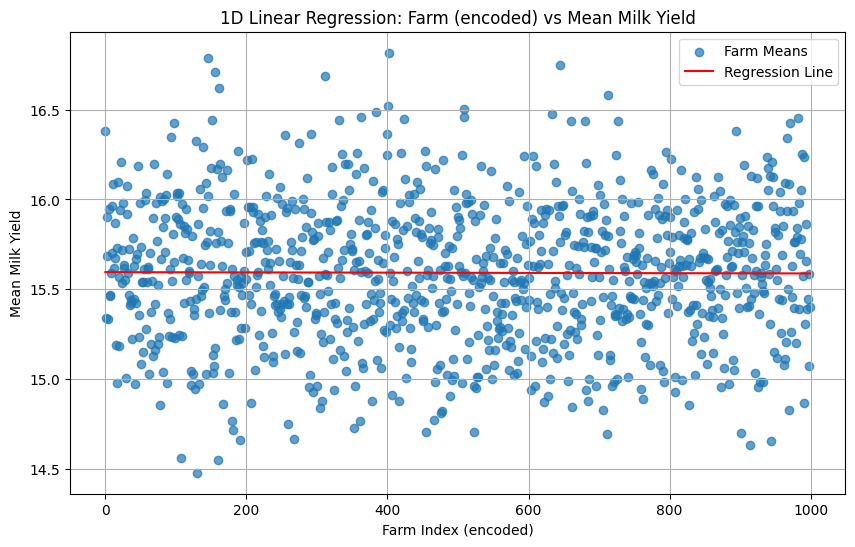

In [ ]:
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr

# 1. Compute mean milk yield per farm
farm_means = df.groupby('Farm_ID')['Milk_Yield_L'].mean().reset_index()
farm_means.rename(columns={'Milk_Yield_L': 'Mean_Milk_Yield'}, inplace=True)

# 2. Convert Farm_ID -> numeric index
farm_means['Farm_Index'] = pd.factorize(farm_means['Farm_ID'])[0]

# Prepare data for 1D regression
X = farm_means[['Farm_Index']].values
y = farm_means['Mean_Milk_Yield'].values

# 3. Fit linear regression
model = LinearRegression()
model.fit(X, y)
y_pred = model.predict(X)

# 4. Compute correlation coefficient
corr, p_value = pearsonr(farm_means['Farm_Index'], farm_means['Mean_Milk_Yield'])

print(f"Pearson correlation coefficient: {corr:.4f}")
print(f"P-value: {p_value:.4e}")

# 5. Plot
plt.figure(figsize=(10, 6))
plt.scatter(farm_means['Farm_Index'], farm_means['Mean_Milk_Yield'], alpha=0.7, label='Farm Means')
plt.plot(farm_means['Farm_Index'], y_pred, color='red', label='Regression Line')
plt.xlabel("Farm Index (encoded)")
plt.ylabel("Mean Milk Yield")
plt.title("1D Linear Regression: Farm (encoded) vs Mean Milk Yield")
plt.legend()
plt.grid(True)
plt.show()

### Step 1.5 - Correlation Matrix

Compute the correlation matrix for only the numeric columns in the data. From this, we can see that Feed Quantity in lbs and kgs are highly correlated, which makes sense since they are both the same metric in different units, and so we can just remove one of them, say the lbs one to be consistent in metric units across the data. Also, the previous week's avg milk yield is highly correlated with rumination time, which we may need to explore further.

                         Age_Months  Weight_kg    Parity  Days_in_Milk  \
Age_Months                 1.000000   0.003065  0.000292      0.002255   
Weight_kg                  0.003065   1.000000  0.000840      0.003204   
Parity                     0.000292   0.000840  1.000000     -0.001857   
Days_in_Milk               0.002255   0.003204 -0.001857      1.000000   
Feed_Quantity_kg           0.000564  -0.002017  0.004270      0.001636   
Feeding_Frequency          0.000509   0.000512  0.000194     -0.000636   
Water_Intake_L            -0.002861   0.000975  0.001066     -0.000842   
Walking_Distance_km       -0.000115  -0.001310  0.002520     -0.001655   
Grazing_Duration_hrs       0.001471   0.001770 -0.005839      0.002851   
Rumination_Time_hrs       -0.016453  -0.001405  0.001767     -0.122439   
Resting_Hours              0.002477   0.002712 -0.000147      0.002111   
Ambient_Temperature_C     -0.002657   0.000019 -0.000695      0.003081   
Humidity_percent          -0.002285  -

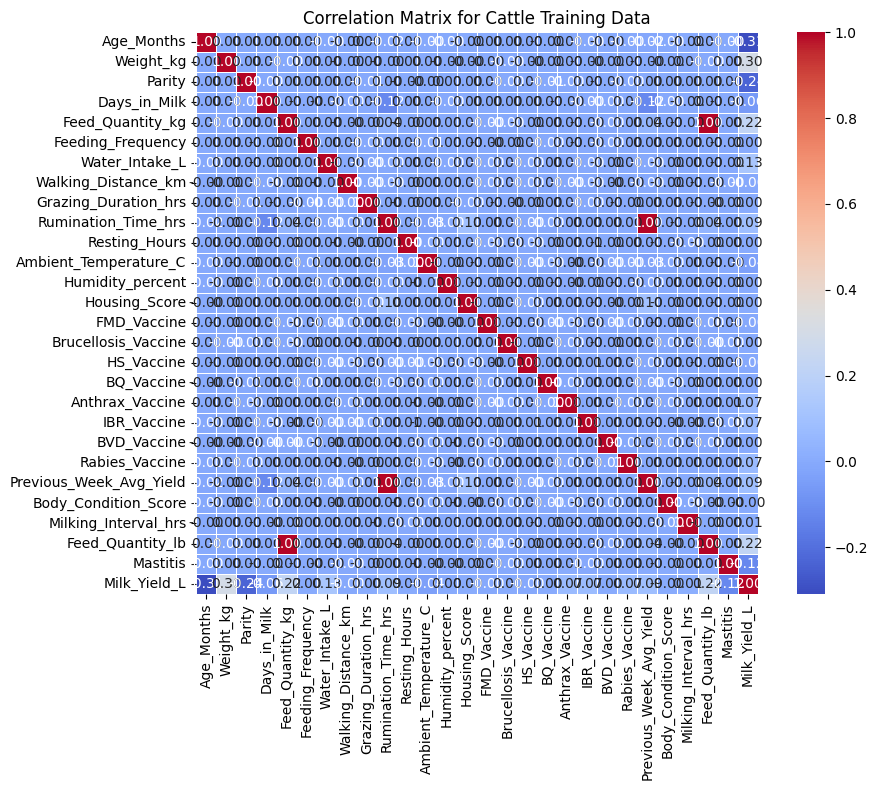

In [ ]:
# Compute the correlation matrix (numeric columns only)
corr_matrix = df.corr(numeric_only=True)

# Optionally, print it
print(corr_matrix)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))  # adjust size as needed
sns.heatmap(
    corr_matrix,
    annot=True,        # show correlation coefficients in each cell
    fmt=".2f",         # format for numbers
    square=True,
    cmap="coolwarm",   # color map
    linewidths=0.5
)
plt.title("Correlation Matrix for Cattle Training Data")
plt.tight_layout()
plt.show()

### Step 1.6: 1D Lin-Reg On Rumination Time v.s. Previous Week Avg Yield

Plot a 1 dimensional linear regression model between rumination time and previous week average yield, which have a suspiciously high correlation in the correlation matrix from earlier. This shows that the two columns are almost perfectly linearly correlated.

In [ ]:
import plotly.graph_objects as go

# Extract the two series
x = df['Rumination_Time_hrs'].values.reshape(-1, 1)
y = df['Previous_Week_Avg_Yield'].values

# Fit 1D linear regression
model = LinearRegression()
model.fit(x, y)
y_pred = model.predict(x)

# Create scatter plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df['Rumination_Time_hrs'],
    y=df['Previous_Week_Avg_Yield'],
    mode='markers',
    name='Data Points',
    marker=dict(size=6, opacity=0.7)
))

# Add regression line
fig.add_trace(go.Scatter(
    x=df['Rumination_Time_hrs'],
    y=y_pred,
    mode='lines',
    name='Linear Regression',
    line=dict(color='red')
))

fig.update_layout(
    title='Rumination Time vs Previous Week Yield (1D Linear Regression)',
    xaxis_title='Rumination Time (hrs)',
    yaxis_title='Previous Week Avg Yield (L)',
    template='plotly_white'
)

fig.show()

#### Step 1.6.1: Negative Rumination Time Values

Additionally, we found a couple of rows that have negative rumination times, which doesn't make sense for the data since time is always positive, so these need to be removed or modified.

In [ ]:
neg_rumination = df[df['Rumination_Time_hrs'] < 0]

# Count them
count_neg = len(neg_rumination)

print("Number of rows with negative rumination time:", count_neg)

# show the head of the rows with negative rummation
neg_rumination.head()

Number of rows with negative rumination time: 106596


,Cattle_ID,Breed,Climate_Zone,Management_System,Age_Months,Weight_kg,Parity,Lactation_Stage,Days_in_Milk,Feed_Type,...,BVD_Vaccine,Rabies_Vaccine,Previous_Week_Avg_Yield,Body_Condition_Score,Milking_Interval_hrs,Date,Farm_ID,Feed_Quantity_lb,Mastitis,Milk_Yield_L
0,CATTLE_133713,Holstein,Tropical,Intensive,114,544.8,4,Mid,62,Concentrates,...,0,1,6.31,3.0,12,2024-01-15,FARM_0301,36.8235,1,12.192634
2,CATTLE_122459,Holstein,Tropical,Semi_Intensive,64,336.6,4,Late,16,Hay,...,1,0,4.07,3.5,12,2024-05-20,FARM_0802,16.0965,0,14.006142
5,CATTLE_090774,Jersey,Continental,Pastoral,50,464.3,5,Late,174,Hay,...,1,0,7.48,3.5,12,2022-10-01,FARM_0766,31.5315,0,20.736971
6,CATTLE_029380,Guernsey,Mediterranean,Pastoral,67,422.3,6,Late,263,Silage,...,1,0,3.58,3.5,8,2024-03-21,FARM_0114,23.1525,0,12.722306
7,CATTLE_081978,Guernsey,Tropical,Pastoral,71,582.7,3,Mid,53,Dry_Fodder,...,0,1,5.14,3.0,12,2024-06-01,FARM_0120,24.4755,0,13.440506


## Step 2: Data Preprocessing, Feature Selection/Creation

### Step 2.0: Remove/Modify Initial Features

Remove all of the features previously identified as irrelevant/inconsequential before moving on. Also, modify the Breed column to have accurate values. **Note that we actually do all of the preprocessing in Section 3 for our models...this was just preliminary preprocessing just for our information, as we realized in Section 3 minimal preprocessing yielded in best RMSE**

In [ ]:
# Drop inconsequential features
df = df.drop(columns=['Cattle_ID', 'Farm_ID', 'Feed_Quantity_lb'])
df = df.drop(columns=['Rumination_Time_hrs'], errors='ignore')

# Modify Breed column to fix misspellings/whitespaces
df['Breed'] = df['Breed'].replace({
    'Holstein ': 'Holstein',
    'Brown Swiss ': 'Brown Swiss',
    ' Brown Swiss': 'Brown Swiss'
})
print(df['Breed'].unique()) # Check that values are accurate now

['Holstein' 'Jersey' 'Guernsey' 'Brown Swiss' 'Holstien']


### Step 2.1: Date to Season Conversion

This feature modification task involves converting the dates into fractional values of the month of year (continuous feature) to indicate seasons, with winter months == [1, 2, 3], spring == [4, 5, 6], summer == [7, 8, 9], and fall == [10, 11, 12].

In [ ]:
df['Date'] = pd.to_datetime(df['Date']) # Convert to datetime object
def continuous_season_value(dt):
    year = dt.year

    # Season boundary timestamps
    win_start = pd.Timestamp(year, 12, 15)
    spring_start = pd.Timestamp(year, 3, 15)
    summer_start = pd.Timestamp(year, 6, 15)
    fall_start   = pd.Timestamp(year, 9, 15)

    # Winter spans across years: Dec 15 -> Mar 15
    # We treat winter as a cyclic segment around 1 and 12.

    # Compute continuous month + fraction of month passed
    month = dt.month
    day = dt.day

    # Convert to continuous month value (e.g., Jan 15 = 1.5)
    # Approximate month midpoints by dividing days by 30.
    cont_month = month + day/30.0

    # ----- Now Apply The Season Mapping -----
    # Winter:   [Dec 15, Mar 15] → ~[12.5 → 3.5]
    # Spring:   [Mar 15, Jun 15] → ~[3.5 → 6.5]
    # Summer:   [Jun 15, Sep 15] → ~[6.5 → 9.5]
    # Fall:     [Sep 15, Dec 15] → ~[9.5 → 12.5]

    # If after Dec 15, add 12 so winter runs 12.5 -> 15.5 (wrap later)
    if dt >= win_start:
        cont_month += 12

    # Wrap everything back into range 1–12 continuous
    if cont_month > 12:
        cont_month -= 12

    return cont_month

# Create the new continuous season feature and drop the date feature
df['Season_Continuous'] = df['Date'].apply(continuous_season_value)
df = df.drop(columns=['Date'])

### Step 2.2: Combine Vaccine Information

Combine all the binary vaccine columns into a single column, vaccine count, that represents the number of vaccines received for each cow. Also, display the current columns to see current changes. **We realized this actually doesn't help the model, keeping all 8 OHE vaccine columns is better**

In [ ]:
# All the vaccine columns in the data
vaccine_cols = [
    'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine', 'BQ_Vaccine',
    'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine', 'Rabies_Vaccine'
]

# Ensure they are 0/1 binary integers
df[vaccine_cols] = df[vaccine_cols].astype(int)

# New feature: total number of vaccines given
df['Vaccine_Count'] = df[vaccine_cols].sum(axis=1)

# Drop the original vaccine columns (we end up not doing this in preprocessing as it removed important information about some vaccines)
df = df.drop(columns=vaccine_cols)
df.head(20)

,Breed,Climate_Zone,Management_System,Age_Months,Weight_kg,Parity,Lactation_Stage,Days_in_Milk,Feed_Type,Feed_Quantity_kg,...,Ambient_Temperature_C,Humidity_percent,Housing_Score,Previous_Week_Avg_Yield,Body_Condition_Score,Milking_Interval_hrs,Mastitis,Milk_Yield_L,Season_Continuous,Vaccine_Count
0,Holstein,Tropical,Intensive,114,544.8,4,Mid,62,Concentrates,16.363455,...,28.706090,70.6,0.871430,6.31,3.0,12,1,12.192634,1.500000,4
2,Holstein,Tropical,Semi_Intensive,64,336.6,4,Late,16,Hay,7.198607,...,12.520386,51.2,0.904957,4.07,3.5,12,0,14.006142,5.666667,4
3,Jersey,Mediterranean,Intensive,58,370.5,1,Early,339,Crop_Residues,18.694344,...,40.510261,57.9,0.324955,10.23,3.0,24,0,24.324325,7.733333,3
4,Guernsey,Subtropical,Intensive,84,641.5,6,Early,125,Mixed_Feed,14.779198,...,-7.711288,73.2,0.871019,20.68,3.0,12,1,12.023074,1.100000,6
5,Jersey,Continental,Pastoral,50,464.3,5,Late,174,Hay,14.338002,...,2.974148,70.0,0.753674,7.48,3.5,12,0,20.736971,10.033333,5
6,Guernsey,Mediterranean,Pastoral,67,422.3,6,Late,263,Silage,10.437089,...,20.221917,37.4,0.328787,3.58,3.5,8,0,12.722306,3.700000,4
7,Guernsey,Tropical,Pastoral,71,582.7,3,Mid,53,Dry_Fodder,10.846287,...,19.448763,54.5,0.572268,5.14,3.0,12,0,13.440506,6.033333,7
8,Brown Swiss,Arid,Pastoral,98,540.3,6,Early,34,Hay,14.038458,...,29.552892,26.6,0.717150,11.04,4.0,12,0,14.938699,9.600000,6
9,Holstein,Tropical,Mixed,40,382.9,6,Mid,352,Pasture_Grass,10.864936,...,16.567410,69.3,0.690189,2.48,3.5,12,1,7.961243,4.800000,6
10,Holstein,Tropical,Extensive,61,664.5,2,Late,304,Concentrates,16.522876,...,10.524706,85.1,0.661553,14.20,3.5,12,0,15.742793,8.900000,3


### Step 2.3: Remove Small Variance Features

Compute the variance of each feature to identify which features have the smallest variances for removal. With a threshold of 0.01*mean, we found that none of these features should be removed from the data.

In [ ]:
from sklearn.preprocessing import LabelEncoder

# 1. Identify categorical columns still remaining
categorical_cols = [
    'Breed', 'Climate_Zone', 'Management_System',
    'Lactation_Stage', 'Feed_Type', 'Mastitis'
]

# 2. Label encode categorical columns so variance/mean comparison works
for col in categorical_cols:
    if col in df.columns:
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col].astype(str))

# 3. Compute variance and mean of ALL numerical columns
stats = pd.DataFrame({
    "mean": df.mean(numeric_only=True),
    "var": df.var(numeric_only=True)
})
stats["threshold"] = 0.01 * stats["mean"]

# 4. Identify low-variance relative to mean based on threshold computed above
low_variance_features = stats[stats["var"] < stats["threshold"]].index.tolist()

print("\n===== Feature Stats (mean, var, threshold) =====\n")
print(stats.sort_values("var"))

print("\n===== Low-Variance Columns (var < 0.01 * mean) =====\n")
print(low_variance_features)


===== Feature Stats (mean, var, threshold) =====

                               mean           var  threshold
Housing_Score              0.648889      0.041031   0.006489
Mastitis                   0.099757      0.089806   0.000998
Body_Condition_Score       3.394393      0.400253   0.033944
Lactation_Stage            1.097541      0.691274   0.010975
Breed                      1.953363      1.548272   0.019534
Vaccine_Count              4.799943      1.915540   0.047999
Feeding_Frequency          2.998817      1.997101   0.029988
Management_System          1.998729      1.999709   0.019987
Parity                     3.500640      2.912081   0.035006
Climate_Zone               2.502831      2.916598   0.025028
Walking_Distance_km        4.035108      3.717105   0.040351
Feed_Type                  3.494576      5.241661   0.034946
Resting_Hours             10.068677      8.221806   0.100687
Grazing_Duration_hrs       6.057674      8.222070   0.060577
Season_Continuous          6.58714

### Step 2.4: 1D Lin-Reg For Features' Correlation With Target

Fit 1D linear regression models on each of the features with the target to see if there are any features highly correlated with the target. In this case, based on the R^2 and correlation coefficients, there aren't any columns like this.

In [ ]:
# FEATURE SELECTION: 1D linear regression for each continuous feature to see if any linear correlation between it and output
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr
import pandas as pd

target = 'Milk_Yield_L'

categorical_cols = [
    'Breed', 'Climate_Zone', 'Management_System',
    'Lactation_Stage', 'Feed_Type', 'Mastitis'
]
# Auto-select continuous (numeric) features
continuous_cols = [
    col for col in df.columns
    if col not in categorical_cols
    and col != target
]

results = []

for col in continuous_cols:
    X = df[[col]].values
    y = df[target].values

    # Fit 1D linear regression
    model = LinearRegression()
    model.fit(X, y)

    # Predictions
    y_pred = model.predict(X)

    # Pearson correlation
    corr, pval = pearsonr(df[col], df[target])

    # R^2 score
    r2 = model.score(X, y)

    results.append({
        'Feature': col,
        'Correlation': corr,
        'P-value': pval,
        'R2 Score': r2,
        'Slope': model.coef_[0],
        'Intercept': model.intercept_
    })

lr_results = pd.DataFrame(results).sort_values('Correlation', ascending=False)

print(lr_results)


                    Feature  Correlation        P-value      R2 Score  \
1                 Weight_kg     0.299939   0.000000e+00  8.996323e-02   
4          Feed_Quantity_kg     0.222903   0.000000e+00  4.968573e-02   
6            Water_Intake_L     0.125727   0.000000e+00  1.580722e-02   
13  Previous_Week_Avg_Yield     0.089766   0.000000e+00  8.057966e-03   
17            Vaccine_Count     0.074415  8.813264e-236  5.537545e-03   
15     Milking_Interval_hrs     0.014749   8.585765e-11  2.175391e-04   
12            Housing_Score     0.004582   4.377203e-02  2.099868e-05   
8      Grazing_Duration_hrs     0.004554   4.511755e-02  2.073476e-05   
11         Humidity_percent     0.001787   4.318053e-01  3.191993e-06   
5         Feeding_Frequency     0.000801   7.244497e-01  6.418936e-07   
9             Resting_Hours     0.000337   8.822465e-01  1.133286e-07   
14     Body_Condition_Score    -0.000850   7.084167e-01  7.224446e-07   
7       Walking_Distance_km    -0.002029   3.720669

### Step 2.5: Perform Final Modifications (**Section 3 ends up not removing features 4 and onwards since our extensive testing showed removing minimal features helped our models**)

Now, one-hot encode the remaining categorical features, standardize all of the continous features, and print the final columns for use in the model training phase.

#### Summary:

From the previous results, here are some of the features we decided to remove/change (but we ended up keeping 4 and 5 in the end due to XGB performing better with these features):

1) Cattle ID: Remove
2) Farm ID: Remove, we ran 1D LR on mean output and no correlation
3) Feed_Quantity_Lbs: Remove, highly correlated with Feed_Quantity_Kg
4) Rumination Time: Remove, correlated with Previous_Week_Avg_Yield
5) Vaccines: Converted to 1 continuous variable
6) Date: Converted to continous season value

Some potential next removals that could be done are:

1) Climate Zone (low chi-square and MI score)
2) Walking Distance
3) Body Condition
4) Resting Time
5) Housing Score
6) Grazing Duration
7) Feeding Frequency

In [ ]:
from sklearn.preprocessing import StandardScaler

# 1. One-hot encode ONLY the correct categorical features
categorical_features = [
    'Breed', 'Climate_Zone', 'Management_System',
    'Lactation_Stage', 'Feed_Type'
]
target = 'Milk_Yield_L'
model_df = pd.get_dummies(df, columns=categorical_features, drop_first=True)

# 2. Standardize continous features
continuous_features = [
    col for col in model_df.columns
    if not col.startswith(tuple(f"{c}_" for c in categorical_features))  # exclude expanded dummies
    and col not in [target]                                             # exclude target
    and col != 'Mastitis'
]
scaler = StandardScaler()
model_df[continuous_features] = scaler.fit_transform(model_df[continuous_features])

# 3. Print final columns
print("Final columns after OHE + standardization:")
print(model_df.columns.tolist())
print(len(model_df))
print(len(model_df.columns))
model_df.head(20)

Final columns after OHE + standardization:
['Age_Months', 'Weight_kg', 'Parity', 'Days_in_Milk', 'Feed_Quantity_kg', 'Feeding_Frequency', 'Water_Intake_L', 'Walking_Distance_km', 'Grazing_Duration_hrs', 'Resting_Hours', 'Ambient_Temperature_C', 'Humidity_percent', 'Housing_Score', 'Previous_Week_Avg_Yield', 'Body_Condition_Score', 'Milking_Interval_hrs', 'Mastitis', 'Milk_Yield_L', 'Season_Continuous', 'Vaccine_Count', 'Breed_1', 'Breed_2', 'Breed_3', 'Breed_4', 'Climate_Zone_1', 'Climate_Zone_2', 'Climate_Zone_3', 'Climate_Zone_4', 'Climate_Zone_5', 'Management_System_1', 'Management_System_2', 'Management_System_3', 'Management_System_4', 'Lactation_Stage_1', 'Lactation_Stage_2', 'Feed_Type_1', 'Feed_Type_2', 'Feed_Type_3', 'Feed_Type_4', 'Feed_Type_5', 'Feed_Type_6', 'Feed_Type_7']
193600
42


,Age_Months,Weight_kg,Parity,Days_in_Milk,Feed_Quantity_kg,Feeding_Frequency,Water_Intake_L,Walking_Distance_km,Grazing_Duration_hrs,Resting_Hours,...,Management_System_4,Lactation_Stage_1,Lactation_Stage_2,Feed_Type_1,Feed_Type_2,Feed_Type_3,Feed_Type_4,Feed_Type_5,Feed_Type_6,Feed_Type_7
0,0.881697,0.310532,0.292626,-1.142994,1.094286,-0.706785,-0.596014,0.381173,0.607631,0.778180,...,False,False,True,False,False,False,False,False,False,False
2,-0.561520,-1.129100,0.292626,-1.580806,-1.214302,-0.706785,-0.964535,-0.303483,0.956378,-0.512205,...,True,True,False,False,False,False,True,False,False,False
3,-0.734705,-0.894693,-1.465381,1.493397,1.681428,-0.706785,-0.586857,0.993214,0.154260,0.010924,...,False,False,False,True,False,False,False,False,False,False
4,0.015767,0.979179,1.464631,-0.543381,0.695218,0.708459,-2.205166,0.702754,0.119385,-0.268078,...,False,False,False,False,False,False,False,True,False,False
5,-0.965620,-0.246098,0.878628,-0.077016,0.584083,0.708459,0.386255,1.200686,-1.380227,-0.372704,...,False,True,False,False,False,False,True,False,False,False
6,-0.474927,-0.536514,1.464631,0.770055,-0.398541,1.416080,-0.113548,-0.842910,-0.647858,1.580311,...,False,True,False,False,False,False,False,False,False,True
7,-0.359469,0.572597,-0.293377,-1.228652,-0.295466,1.416080,0.750804,-0.199748,1.374875,2.103440,...,False,False,True,False,True,False,False,False,False,False
8,0.419868,0.279416,1.464631,-1.409488,0.508629,-1.414406,-1.229133,0.822050,0.084511,-1.279461,...,False,False,False,False,False,False,True,False,False,False
9,-1.254263,-0.808951,1.464631,1.617126,-0.290768,0.000837,-0.241806,-0.775481,1.130752,0.499178,...,False,False,True,False,False,False,False,False,True,False
10,-0.648113,1.138216,-0.879379,1.160279,1.134444,0.000837,-1.690731,1.387410,-1.415102,0.708429,...,False,True,False,False,False,False,False,False,False,False


## Step 3: Model Training and Development

### Overview:

Here are the 3 initial approaches we thought of using for this problem:

1. Random Forest
2. XGBoost
3. Multilayer Perceptron (Feedforward Neural Net)

After this, we try more advanced models/configurations involving CatBoost and Light Gradient Boosting Machine (LGBM).

### Step 3.0: Preprocess Functions for Ease of Use

Create a preprocess function that combines all prior steps of data cleaning, preprocessing, and feature selection/creation for ease of use when model training.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Preprocess function combining all prior steps for convenience
def preprocess(df_raw, ohe=False, scaler=None, fit_scaler=False, need_scale=True):
    df = df_raw.copy()

    # 1. Convert Date -> Season Continuous
    df['Date'] = pd.to_datetime(df['Date'])

    def continuous_season_value(dt):
        year = dt.year
        win_start = pd.Timestamp(year, 12, 15)
        cont_month = dt.month + dt.day / 30.0
        if dt >= win_start:
            cont_month += 12
        if cont_month > 12:
            cont_month -= 12
        return cont_month

    df['Season_Continuous'] = df['Date'].apply(continuous_season_value)

    # next 2 features are engineered based on some agricultural research (apparently are used in real world)
    # TURNED OUT TO BE USELESS
    # df['THI'] = (0.8 * df['Ambient_Temperature_C'] + (df['Humidity_percent'] / 100) * (df['Ambient_Temperature_C'] - 14.4) + 46.4)
    # df['DIM_log'] = np.log1p(df['Days_in_Milk'])

    # Phase shift rumination time to remove negative values
    df['Rumination_Time_hrs'] = df['Rumination_Time_hrs'] - df['Rumination_Time_hrs'].min()
    df = df.drop(columns=['Date'], errors='ignore')

    # 2. Vaccines -> Vaccine_Count (TURNED OUT TO BE USELESS)
    # vaccine_cols = [
    #     'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine', 'BQ_Vaccine',
    #     'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine', 'Rabies_Vaccine'
    # ]
    # df[vaccine_cols] = df[vaccine_cols].astype(int)
    # df['Vaccine_Count'] = df[vaccine_cols].sum(axis=1)
    # df = df.drop(columns=vaccine_cols)

    # 3. Drop irrelevant or harmful columns
    drop_cols = [
        'Cattle_ID', 'Farm_ID', 'Feed_Quantity_lb',
        # 'Previous_Week_Avg_Yield',
        # 'Rumination_Time_hrs',

        # 'Climate_Zone',
        # 'Feed_Type',
        # 'Management_System',
        # 'Breed',
        # 'Walking_Distance_km',
        # 'Resting_Hours',
        # 'Housing_Score',
        # 'Grazing_Duration_hrs',
        # 'Body_Condition_Score',
        # 'Feeding_Frequency'

    ]
    df = df.drop(columns=drop_cols, errors='ignore')

    # 4. One-hot encode categoricals based on OHE flag
    categorical_features = [
        'Breed',
        'Management_System',
        'Lactation_Stage',
        'Feed_Type',
        'Climate_Zone'
    ]

    df['Breed'] = df['Breed'].replace({
      'Holstien': 'Holstein',
      'Holstien ': 'Holstein',
      'Holstein ': 'Holstein',
    }) # Deal with holstein misspellings

    if ohe:
      for col in categorical_features:
          df[col] = df[col].astype(str).str.strip()
      df = pd.get_dummies(df, columns=categorical_features, drop_first=True)

    # 5. Continuous features + NaN handling
    continuous_features = [
        col for col in df.columns
        if col not in ['Milk_Yield_L']
        and not col.startswith(tuple(f"{c}_" for c in categorical_features))
        and col != 'Mastitis'
    ]
    df[continuous_features] = df[continuous_features].fillna(
        df[continuous_features].mean(numeric_only=True)
    )

    print(df.columns.tolist(), len(df.columns))
    return df, scaler

### Step 3.1: Random Forest

Perform a random search of 45 configurations across a set of hyperparameters to find the best performing random forest model.

Result: The validation RMSE is 4.250, which is a decent start, but can be improved significantly, so other models may be better suited for this task.

**NOTE: This cell doesn't run correctly anymore as we updated our preprocess function to work for the other models we created, but here is the output that we got originally (hence why we decided not to go forwards with this approach):**

```python
Fitting 3 folds for each of 15 candidates, totalling 45 fits
Best Parameters: {'random_state': 42, 'n_estimators': 200, 'min_samples_split': 10,
                  'min_samples_leaf': 2, 'max_depth': 20}
RMSE: 4.2500836092256
Test RMSE: 4.2501

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import RandomizedSearchCV

# Run data through preprocess function
model_df, scaler = preprocess(df, fit_scaler=True, need_scale=False)

# Split the data into features (X) and target (y)
X = model_df.drop(columns=[target])
y = model_df[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Random Forest params
rf_params = {
    'n_estimators': [10, 20, 50, 100, 200],
    'max_depth': [1, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

# Train
rf_model = RandomForestRegressor()
rf_random = RandomizedSearchCV(
    estimator=rf_model,
    param_distributions=rf_params,
    n_iter=15,
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1
)
rf_random.fit(X_train, y_train)

# Best params
print("Best Parameters:", rf_random.best_params_)

# Predict + RMSE
y_pred = rf_random.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("RMSE:", rmse)
print(f"Test RMSE: {rmse:.4f}")

### Step 3.2: XGBoost

Perform grid search across a set of hyperparameters to determine best performing XGBoost model.

Result: For regular grid search with XGBoost, the validation RMSE is x.xxx. When training XGBoost with Optuna, the validation RMSE is 4.141.

#### 3.2.1: XGBoost Preparation
Uninstall and re-install XGBoost library for latest version.

In [ ]:
!pip uninstall -y xgboost
!pip install xgboost --no-cache-dir

Found existing installation: xgboost 3.1.2
Uninstalling xgboost-3.1.2:
  Successfully uninstalled xgboost-3.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 MB 111.3 MB/s eta 0:00:00


In [ ]:
# printing out mean/std of output for train dataset
df = pd.read_csv("cattle_data_train.csv")

df = df.dropna()
df = df[df['Milk_Yield_L'] >= 0]
print(df['Milk_Yield_L'].mean(), df['Milk_Yield_L'].std())

15.59873230167153 5.347774418541983


#### Step 3.2.2: Train XGBoost

Perform grid search to train various hyperparameter configurations of XGBoost and report the best-performing one.

In [ ]:
# XGBOOST
import itertools
from xgboost.sklearn import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Load data
df = pd.read_csv("cattle_data_train.csv")

# Drop NaNs ONLY from training data
df_train_raw = df.dropna()

# drop all negative output labels (Milk_Yield_L)
df_train_raw = df_train_raw[df_train_raw['Milk_Yield_L'] >= 0]
print(len(df_train_raw))

# Preprocess training data (no scaling needed for XGBoost)
train_df, _ = preprocess(df_train_raw, ohe=True, fit_scaler=True, need_scale=False)

# Ensure we know the column list
train_columns = train_df.columns.tolist()

# Train/Val Split
X = train_df.drop(columns=["Milk_Yield_L"])
y = train_df["Milk_Yield_L"]

X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.1, random_state=67
)

# Grid Search Hyperparameters
# param_grid = {
#     'learning_rate': [0.01, 0.02, 0.03],
#     'max_depth': [3, 4, 5, 6],
#     'subsample': [0.6, 0.675, 0.725],
#     'colsample_bytree': [0.625, 0.7,0.75],
# }

# More Optuna optimal parameters
# param_grid = {
#     'learning_rate': [0.01],
#     'max_depth': [4],
#     'subsample': [0.675],
#     'colsample_bytree': [0.525],
# }

# param_grid = {
#     'learning_rate': [0.00655],
#     'max_depth': [4],
#     'subsample': [0.606],
#     'colsample_bytree': [0.368],
#     'min_child_weight': [1.44],
#     'reg_lambda': [2.34],
# }

# Best generalized to Kaggle test set
param_grid = {
    'learning_rate': [0.00818],
    'max_depth': [4],
    'subsample': [0.6445],
    'colsample_bytree': [0.5623],
    'min_child_weight': [2.46],
    'reg_lambda': [2.16],
}

best_rmse = float("inf")
best_params = None

print("Running Grid Search...\n")

for learning_rate, max_depth, subsample, colsample in itertools.product(
    param_grid['learning_rate'],
    param_grid['max_depth'],
    param_grid['subsample'],
    param_grid['colsample_bytree']
):

    model = XGBRegressor(
        objective='reg:squarederror',
        learning_rate=learning_rate,
        max_depth=max_depth,
        subsample=subsample,
        colsample_bytree=colsample,
        n_estimators=7000,
        early_stopping_rounds=300,
        tree_method='hist',
        eval_metric='rmse'
    )

    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    y_pred = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, y_pred))

    print(f"learning_rate={learning_rate}, depth={max_depth}, subs={subsample}, col={colsample} → RMSE={rmse:.4f}")

    if rmse < best_rmse:
        best_rmse = rmse
        best_params = {
            'learning_rate': learning_rate,
            'max_depth': max_depth,
            'subsample': subsample,
            'colsample_bytree': colsample
        }

print("\nBEST PARAMS:", best_params)
print("BEST RMSE:", best_rmse)

# -------------------------------------------------
# Train final model using best params
# -------------------------------------------------
print("\nTraining final model with best parameters...")

final_model = XGBRegressor(
    objective='reg:squarederror',
    learning_rate=best_params['learning_rate'],
    max_depth=best_params['max_depth'],
    subsample=best_params['subsample'],
    colsample_bytree=best_params['colsample_bytree'],
    n_estimators=7000,
    early_stopping_rounds=300,
    tree_method='hist',
    eval_metric='rmse'
)

final_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    verbose=False
)

# Final Validation RMSE
final_pred = final_model.predict(X_val)
final_rmse = np.sqrt(mean_squared_error(y_val, final_pred))

importance_dict = final_model.get_booster().get_score(importance_type='gain')
importances = pd.Series(importance_dict).sort_values(ascending=False)

print("\nTop 15 feature importances:")
print(importances)

print("Best Iteration: " + str(final_model.best_iteration))

print(f"\nFinal Validation RMSE: {final_rmse:.4f}")

193529
['Age_Months', 'Weight_kg', 'Parity', 'Days_in_Milk', 'Feed_Quantity_kg', 'Feeding_Frequency', 'Water_Intake_L', 'Walking_Distance_km', 'Grazing_Duration_hrs', 'Rumination_Time_hrs', 'Resting_Hours', 'Ambient_Temperature_C', 'Humidity_percent', 'Housing_Score', 'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine', 'BQ_Vaccine', 'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine', 'Rabies_Vaccine', 'Previous_Week_Avg_Yield', 'Body_Condition_Score', 'Milking_Interval_hrs', 'Mastitis', 'Milk_Yield_L', 'Season_Continuous', 'Breed_Guernsey', 'Breed_Holstein', 'Breed_Jersey', 'Management_System_Intensive', 'Management_System_Mixed', 'Management_System_Pastoral', 'Management_System_Semi_Intensive', 'Lactation_Stage_Late', 'Lactation_Stage_Mid', 'Feed_Type_Crop_Residues', 'Feed_Type_Dry_Fodder', 'Feed_Type_Green_Fodder', 'Feed_Type_Hay', 'Feed_Type_Mixed_Feed', 'Feed_Type_Pasture_Grass', 'Feed_Type_Silage', 'Climate_Zone_Continental', 'Climate_Zone_Mediterranean', 'Climate_Zone_Subtropical', 

In [ ]:
import sys
print(sys.version)
!nvidia-smi

3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
Sun Nov 23 05:49:29 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A

Step 3.2.3: Train XGBoost with Optuna

Now, perform the same grid search, but using Optuna, a gradient based hyperparameter tuning approach, to train various configurations of XGBoost and report the best-performing one.

In [ ]:
# XGBOOST + OPTUNA TUNING

!pip install optuna
import optuna
import numpy as np
import pandas as pd
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# DATA
df = pd.read_csv("cattle_data_train.csv")
df_train_raw = df.dropna()
df_train_raw = df_train_raw[df_train_raw['Milk_Yield_L'] >= 0]

train_df, _ = preprocess(df_train_raw, ohe=True, fit_scaler=True, need_scale=False)

X = train_df.drop(columns=["Milk_Yield_L"])
y = train_df["Milk_Yield_L"]

X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# OPTUNA OBJECTIVE
def objective(trial):

    params = {
        "objective": "reg:squarederror",

        # learning rate tuning
        "learning_rate": trial.suggest_float("learning_rate", 0.005, 0.0085),
        "max_depth": 4,

        # sampling (very important tuning)
        "subsample": trial.suggest_float("subsample", 0.55, 0.75),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.30, 0.60),

        # regularization
        "min_child_weight": trial.suggest_float("min_child_weight", 2.0, 5.0),
        "gamma": 0.0,
        "reg_alpha": 0.0,
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 2.5),

        # type of booster and iteration time attributes
        "tree_method": "hist",
        "n_estimators": 7000,
        "eval_metric": "rmse",
        "early_stopping_rounds": 300,
    }

    model = XGBRegressor(**params)

    model.fit(
        X_train,
        y_train,
        eval_set=[(X_val, y_val)],
        verbose=False,
    )

    preds = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, preds))
    return rmse

# RUN OPTUNA
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=80)

print("\nBEST PARAMS:", study.best_params)
print("BEST RMSE:", study.best_value)

best_params = study.best_params

# TRAIN FINAL MODEL WITH BEST PARAMS
final_model = XGBRegressor(
    **best_params,
    objective="reg:squarederror",
    tree_method="hist",
    n_estimators=7000,
    early_stopping_rounds=300,
    eval_metric="rmse",
)

final_model.fit(
    X_train,
    y_train,
    eval_set=[(X_val, y_val)],
    verbose=False,
)

final_pred = final_model.predict(X_val)
final_rmse = np.sqrt(mean_squared_error(y_val, final_pred))
print("\nFinal Validation RMSE:", final_rmse)
print("Best iteration:", final_model.best_iteration_)


Step 3.2.4: 5 and 10 fold CV on XGBoost+CatBoost ensemble. Based on the code in step 3.4...we wanted to try CatBoost with XGBoost, and we added cross validation for more robustness, which did improve our Kaggle RMSE by over 0.004 (**Ended up being our best model)**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
!pip install catboost
from catboost import CatBoostRegressor

# STACKING OF XGBOOST AND CATBOOST WITH CROSS VALIDATION
# 1. Load data
train_df = pd.read_csv("cattle_data_train.csv")
test_df  = pd.read_csv("cattle_data_test.csv")
test_ids = test_df["Cattle_ID"]

# ensuring no null values in training dataframe and no negative output values
train_df = train_df.dropna()
train_df = train_df[train_df['Milk_Yield_L'] >= 0]

# 2. Preprocess using YOUR FUNCTION
train_processed, scaler = preprocess(
    train_df,
    ohe=True,
    fit_scaler=True,
    need_scale=True
)

test_processed, _ = preprocess(
    test_df,
    ohe=True,
    scaler=scaler,
    fit_scaler=False,
    need_scale=True
)

# Align columns (for OHE)
missing_cols = set(train_processed.columns) - set(test_processed.columns)
for col in missing_cols:
    test_processed[col] = 0

test_processed = test_processed[train_processed.columns]

# Separate target
y = train_processed["Milk_Yield_L"].values
X = train_processed.drop(columns=["Milk_Yield_L"]).values
X_test = test_processed.drop(columns=["Milk_Yield_L"], errors="ignore").values

# 3. Model hyperparameters
xgb_params = {
    "learning_rate": 0.00818,
    "max_depth": 4,
    "subsample": 0.6445,
    "colsample_bytree": 0.5623,
    "min_child_weight": 2.46,
    "reg_lambda": 2.16,
    "n_estimators": 7000,
    "early_stopping_rounds":300,
    "objective": "reg:squarederror",
    "tree_method": "hist",
    "eval_metric":"rmse"
}

cat_params = {
    "depth": 6,
    "learning_rate": 0.015, # 0.03
    "l2_leaf_reg": 5, # 3
    "loss_function": "RMSE",
    "iterations": 7000,
    "random_strength": 0.7, # 1.1
    "bootstrap_type": "Bernoulli", # Bayesian
    "subsample": 0.7, # 0.7
    "verbose": False,
    "early_stopping_rounds": 300
}

# 4. CV Setup
seeds = [67]
kf = KFold(n_splits=5, shuffle=True, random_state=67) # tried 10 fold too...but 5 gave slight improvements

# Storage for XGB
oof_xgb = np.zeros(len(X))
test_xgb = np.zeros(len(X_test))

# Storage for CatBoost
oof_cat = np.zeros(len(X))
test_cat = np.zeros(len(X_test))

rmse_xgb = []
rmse_cat = []

# 5. Run stacked CV loops
for seed in seeds:
    fold_idx = 1
    print(f"\n==============================")
    print(f"### SEED {seed} ###")
    print("==============================\n")

    for train_idx, val_idx in kf.split(X):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        # ---- XGBoost ----
        model_xgb = XGBRegressor(**xgb_params, random_state=seed+fold_idx)
        model_xgb.fit(
            X_train, y_train,
            eval_set=[(X_val, y_val)],
            verbose=False,
        )

        pred_xgb = model_xgb.predict(X_val)
        rm = np.sqrt(mean_squared_error(y_val, pred_xgb))
        rmse_xgb.append(rm)
        oof_xgb[val_idx] += pred_xgb
        test_xgb += model_xgb.predict(X_test)

        # ---- CatBoost ----
        model_cat = CatBoostRegressor(**cat_params, random_state=seed+fold_idx)
        model_cat.fit(X_train, y_train, eval_set=(X_val, y_val), use_best_model=True)

        pred_cat = model_cat.predict(X_val)
        rm2 = np.sqrt(mean_squared_error(y_val, pred_cat))
        rmse_cat.append(rm2)
        oof_cat[val_idx] += pred_cat
        test_cat += model_cat.predict(X_test)

        print(f"Fold {fold_idx}: XGB={rm:.4f} | CAT={rm2:.4f}")
        fold_idx += 1

# Average accumulations
oof_xgb /= len(seeds)
oof_cat /= len(seeds)
test_xgb /= (len(seeds) * kf.n_splits)
test_cat /= (len(seeds) * kf.n_splits)

print("\n=== CV COMPLETE ===")

['Age_Months', 'Weight_kg', 'Parity', 'Days_in_Milk', 'Feed_Quantity_kg', 'Feeding_Frequency', 'Water_Intake_L', 'Walking_Distance_km', 'Grazing_Duration_hrs', 'Rumination_Time_hrs', 'Resting_Hours', 'Ambient_Temperature_C', 'Humidity_percent', 'Housing_Score', 'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine', 'BQ_Vaccine', 'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine', 'Rabies_Vaccine', 'Previous_Week_Avg_Yield', 'Body_Condition_Score', 'Milking_Interval_hrs', 'Mastitis', 'Milk_Yield_L', 'Season_Continuous', 'Breed_Guernsey', 'Breed_Holstein', 'Breed_Jersey', 'Management_System_Intensive', 'Management_System_Mixed', 'Management_System_Pastoral', 'Management_System_Semi_Intensive', 'Lactation_Stage_Late', 'Lactation_Stage_Mid', 'Feed_Type_Crop_Residues', 'Feed_Type_Dry_Fodder', 'Feed_Type_Green_Fodder', 'Feed_Type_Hay', 'Feed_Type_Mixed_Feed', 'Feed_Type_Pasture_Grass', 'Feed_Type_Silage', 'Climate_Zone_Continental', 'Climate_Zone_Mediterranean', 'Climate_Zone_Subtropical', 'Climat

In [ ]:
# NOW ACTUALLY PRODUCING ENSEMBLE TEST DATA VIA RIDGE STACKING (since ridge does regularization too)
from sklearn.linear_model import RidgeCV

# recompute just in case
rmse_xgb_oof = np.sqrt(mean_squared_error(y, oof_xgb))
rmse_cat_oof = np.sqrt(mean_squared_error(y, oof_cat))

print("\n======================================")
print(f"XGB  OOF RMSE: {rmse_xgb_oof:.6f}")
print(f"CAT  OOF RMSE: {rmse_cat_oof:.6f}")
print("======================================")

meta_X = np.column_stack([oof_xgb, oof_cat])
meta_test = np.column_stack([test_xgb, test_cat])

# valid alpha list
alphas = [1e-6, 1e-4, 1e-3, 1e-2, 1e-1, 1.0, 10.0]

ridge = RidgeCV(alphas=alphas)
ridge.fit(meta_X, y)

stack_oof = ridge.predict(meta_X)
rmse_stack_oof = np.sqrt(mean_squared_error(y, stack_oof))

print("\n============= STACKING (RIDGE) =============")
print("Chosen alpha:       ", ridge.alpha_)
print("Ridge coefficients: ", ridge.coef_)
print("--------------------------------------------")
print(f"XGB   OOF RMSE:   {rmse_xgb_oof:.6f}")
print(f"CAT   OOF RMSE:   {rmse_cat_oof:.6f}")
print(f"STACK OOF RMSE:   {rmse_stack_oof:.6f}")
print("============================================\n")

# predict test with stacked model
final_test_preds = ridge.predict(meta_test)

submission = pd.DataFrame({
    "Cattle_ID": test_ids,
    "Milk_Yield_L": final_test_preds
})

submission.to_csv("submission_stacked_ridge_5_fold.csv", index=False)

print("Saved submission_stacked_ridge.csv")


XGB  OOF RMSE: 4.113366
CAT  OOF RMSE: 4.112103

============= STACKING (RIDGE) =============
Chosen alpha:        10.0
Ridge coefficients:  [0.36013228 0.65133725]
--------------------------------------------
XGB   OOF RMSE:   4.113366
CAT   OOF RMSE:   4.112103
STACK OOF RMSE:   4.111354

Saved submission_stacked_ridge.csv


#### 3.2.5: XGBoost (Without Ensemble so must be run with 3.2.1) Submission

Since this model performed really well on the test set, run the model through the test data provided to create CSV of predictions for submission to Kaggle.

In [ ]:
import pandas as pd
import numpy as np

# ==========================================
# Use final_model (XGBRegressor)
# ==========================================
best_model = final_model

# =====================
# Preprocess test data
# =====================
test_df = pd.read_csv("cattle_data_test.csv")
id_col = test_df["Cattle_ID"]

test_clean, _ = preprocess(
    test_df,
    ohe=True,
    scaler=None,
    fit_scaler=False,
    need_scale=False
)

# Make sure test has *all* columns the model was trained on
for col in X.columns:
    if col not in test_clean.columns:
        test_clean[col] = 0

# Remove extra/unexpected columns
test_clean = test_clean[X.columns]

# ======================
# Predict with XGBRegressor
# ======================
final_preds = best_model.predict(test_clean)

# ======================
# Build submission
# ======================
submission = pd.DataFrame({
    "Cattle_ID": id_col,
    "Milk_Yield_L": final_preds
})

submission.to_csv("submission.csv", index=False)
print("submission.csv created successfully!")
submission.head()


['Age_Months', 'Weight_kg', 'Parity', 'Days_in_Milk', 'Feed_Quantity_kg', 'Feeding_Frequency', 'Water_Intake_L', 'Walking_Distance_km', 'Grazing_Duration_hrs', 'Rumination_Time_hrs', 'Resting_Hours', 'Ambient_Temperature_C', 'Humidity_percent', 'Housing_Score', 'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine', 'BQ_Vaccine', 'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine', 'Rabies_Vaccine', 'Previous_Week_Avg_Yield', 'Body_Condition_Score', 'Milking_Interval_hrs', 'Mastitis', 'Season_Continuous', 'Breed_Guernsey', 'Breed_Holstein', 'Breed_Jersey', 'Management_System_Intensive', 'Management_System_Mixed', 'Management_System_Pastoral', 'Management_System_Semi_Intensive', 'Lactation_Stage_Late', 'Lactation_Stage_Mid', 'Feed_Type_Crop_Residues', 'Feed_Type_Dry_Fodder', 'Feed_Type_Green_Fodder', 'Feed_Type_Hay', 'Feed_Type_Mixed_Feed', 'Feed_Type_Pasture_Grass', 'Feed_Type_Silage', 'Climate_Zone_Continental', 'Climate_Zone_Mediterranean', 'Climate_Zone_Subtropical', 'Climate_Zone_Temperate

,Cattle_ID,Milk_Yield_L
0,1,18.845379
1,2,10.442507
2,3,24.364317
3,4,15.232546
4,5,18.471523


### Step 3.3: Multilayer Perceptron

Create and try out through random search several MLP network configurations with various hidden layer sizes, activation functions (ReLU, tanh, LeakyReLU), Adam optimizer, and learning rate schedulers (constant vs adaptive).

Result: The validation RMSE is 4.19. **Definitely much worse than XGB and CatBoost**

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import numpy as np
import optuna

optuna.logging.set_verbosity(optuna.logging.WARNING)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

target = "Milk_Yield_L"

df_model = df.dropna(subset=[target])
train_raw, val_raw = train_test_split(df_model, test_size=0.2, random_state=42)

train_df, scaler = preprocess(train_raw, ohe=True, fit_scaler=True, need_scale=True)
val_df, _ = preprocess(val_raw, ohe=True, scaler=scaler, fit_scaler=False, need_scale=True)

feature_cols = [c for c in train_df.columns if c != target]

# Align validation columns to training columns
for col in feature_cols:
    if col not in val_df.columns:
        val_df[col] = 0
extra_cols = [c for c in val_df.columns if c not in feature_cols + [target]]
val_df = val_df.drop(columns=extra_cols)
val_df = val_df[feature_cols + [target]]

X_train = train_df[feature_cols].astype(np.float32).values
X_val = val_df[feature_cols].astype(np.float32).values
y_train_raw = train_df[target].astype(np.float32).values
y_val_raw = val_df[target].astype(np.float32).values

X_train_t = torch.tensor(X_train, dtype=torch.float32)
X_val_t   = torch.tensor(X_val,   dtype=torch.float32)

y_scaler = StandardScaler()
y_train = y_scaler.fit_transform(y_train_raw.reshape(-1,1)).astype(np.float32)
y_val   = y_scaler.transform(y_val_raw.reshape(-1,1)).astype(np.float32)

y_train_t = torch.tensor(y_train, dtype=torch.float32)
y_val_t   = torch.tensor(y_val,   dtype=torch.float32)

train_ds = TensorDataset(X_train_t, y_train_t)
val_ds   = TensorDataset(X_val_t, y_val_t)

input_dim = X_train_t.shape[1]

def get_activation(name: str):
    name = name.lower()
    if name == "relu":
        return nn.ReLU()
    if name == "tanh":
        return nn.Tanh()
    if name == "leaky_relu":
        return nn.LeakyReLU(negative_slope=0.01)
    raise ValueError(f"Unsupported activation: {name}")

class MLP(nn.Module):
    def __init__(self, input_dim, hidden=(512,), dropout=0.15, activation="relu"):
        super().__init__()
        layers=[]
        prev=input_dim
        for h in hidden:
            layers += [nn.Linear(prev,h), get_activation(activation), nn.BatchNorm1d(h), nn.Dropout(dropout)]
            prev=h
        layers += [nn.Linear(prev,1)]
        self.net = nn.Sequential(*layers)
    def forward(self,x):
        return self.net(x)

def train_eval(hidden, lr, weight_decay, dropout, batch_size, patience, activation,
               max_epochs=150, seed=42, return_model=False):

    torch.manual_seed(seed); np.random.seed(seed)
    num_workers = 8
    train_dl_opt = DataLoader(
        train_ds,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
        persistent_workers=True
    )
    val_dl_opt   = DataLoader(
        val_ds,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
        persistent_workers=True
    )

    model = MLP(input_dim, hidden=hidden, dropout=dropout, activation=activation).to(device)
    opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        opt,
        mode='min',
        factor=0.5,
        patience=2,
        min_lr=1e-6,
    )

    scaler_amp = torch.cuda.amp.GradScaler(enabled=device.type=="cuda")

    best_rmse = float("inf")
    best_state = None
    no_improve = 0

    for epoch in range(max_epochs):
        model.train()
        for xb, yb in train_dl_opt:

            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)

            opt.zero_grad()
            with torch.cuda.amp.autocast(enabled=device.type=="cuda"):
                pred = model(xb)
                loss = nn.functional.mse_loss(pred, yb)
            scaler_amp.scale(loss).backward()
            scaler_amp.step(opt)
            scaler_amp.update()


        model.eval()
        with torch.no_grad():
            preds=[]; ys=[]
            for xb, yb in val_dl_opt:
                xb = xb.to(device, non_blocking=True)
                yb = yb.to(device, non_blocking=True)

                pred = model(xb)
                preds.append(pred.cpu().numpy())
                ys.append(yb.cpu().numpy())
            preds = np.vstack(preds)
            ys = np.vstack(ys)

            preds_unscaled = y_scaler.inverse_transform(preds)[:,0]
            ys_unscaled = y_scaler.inverse_transform(ys)[:,0]
            rmse = np.sqrt(mean_squared_error(ys_unscaled, preds_unscaled))

        scheduler.step(rmse)

        if rmse < best_rmse - 1e-4:
            best_rmse = rmse
            best_state = {k: v.cpu() for k, v in model.state_dict().items()}
            no_improve = 0
        else:
            no_improve += 1

        if no_improve >= patience:
            break

    model.load_state_dict(best_state)
    model.to(device)

    if return_model:
        return model, best_rmse
    return best_rmse


def objective(trial):
    h1 = trial.suggest_int("h1", 128, 512, step=64)
    h2 = trial.suggest_int("h2", 0,   256, step=32)  # 0 = optional second layer
    h3 = trial.suggest_int("h3", 0,   128, step=32)  # 0 = optional third layer
    h4 = trial.suggest_int("h4", 0,   128, step=32)  # 0 = optional fourth layer
    h5 = trial.suggest_int("h5", 0,   128, step=32)  # 0 = optional fifth layer
    h6 = trial.suggest_int("h6", 0,   128, step=32)  # 0 = optional sixth layer
    hidden = tuple(h for h in (h1, h2, h3, h4, h5, h6) if h > 0)

    activation = trial.suggest_categorical("activation", ["relu", "leaky_relu", "tanh"])
    dropout = trial.suggest_float("dropout", 0.05, 0.30)


    batch_size = trial.suggest_categorical(
        "batch_size",
        [2048, 4096, 8192]
    )

    lr = trial.suggest_float("lr", 5e-4, 3e-3, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-6, 3e-4, log=True)
    patience = trial.suggest_int("patience", 8, 16)

    rmse = train_eval(
        hidden,
        lr,
        weight_decay,
        dropout,
        batch_size,
        patience,
        activation,
        max_epochs=150,
        seed=42
    )
    return rmse

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=15, show_progress_bar=True)

print("Best validation RMSE:", study.best_trial.value)
print("Best params:", study.best_trial.params)

best_params = study.best_trial.params
best_hidden = tuple(
    h for h in (
        best_params["h1"],
        best_params["h2"],
        best_params["h3"],
        best_params["h4"],
        best_params["h5"],
        best_params["h6"]
    ) if h > 0
)

best_model_opt, best_rmse_opt = train_eval(
    best_hidden,
    best_params["lr"],
    best_params["weight_decay"],
    best_params["dropout"],
    best_params["batch_size"],
    best_params["patience"],
    best_params["activation"],
    max_epochs=150,
    seed=42,
    return_model=True,
)
print(f"Retained Optuna model RMSE (unscaled): {best_rmse_opt:.4f}")
best_model_opt.eval()

### Step 3.4: More Advanced Models

Next, we'll try more advanced models such as CatBoost, the Light Gradient Boosting Machine (LGBM), and finally, an ensemble of these boosting models.

#### Step 3.4.1: CatBoost

Perform grid search across a set of hyperparameters to determine best performing CatBoost model.

Result: The validation RMSE is 4.111.

##### CatBoost Installation:

In [ ]:
!pip install catboost

##### Train CatBoost:

Run a grid search on various hyperparameter configurations using Optuna to find the best model.

In [ ]:
import optuna
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# -------------------------------------------------
# Load data
# -------------------------------------------------
df = pd.read_csv("cattle_data_train.csv")

# Drop training rows with missing target
df = df.dropna(subset=["Milk_Yield_L"])
df = df[df['Milk_Yield_L'] >= 0]

# -------------------------------------------------
# Preprocess (ohe=False for CatBoost)
# -------------------------------------------------
train_df, scaler = preprocess(df, ohe=False, fit_scaler=True, need_scale=False)

# Identify categorical features (strings/objects)
cat_features = [col for col in train_df.columns if train_df[col].dtype == 'object' or train_df[col].dtype.name == 'category']
print("Categorical Features:", cat_features)

# Split X and y
X = train_df.drop(columns=["Milk_Yield_L"])
y = train_df["Milk_Yield_L"]

# Train/Validation Split
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# -------------------------------------------------
# OPTUNA OBJECTIVE
# -------------------------------------------------
def objective(trial):
    params = {
        "iterations": 2000,
        "loss_function": "RMSE",
        "eval_metric": "RMSE",
        "random_seed": 42,
        "early_stopping_rounds": 50,
        "verbose": False,
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1),
        "depth": trial.suggest_int("depth", 4, 10),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1, 10),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "task_type": "GPU",
        "devices": "0",
        "bootstrap_type": "Bernoulli"
    }

    model = CatBoostRegressor(**params)

    model.fit(
        X_train, y_train,
        eval_set=(X_val, y_val),
        cat_features=cat_features,
        verbose=False
    )

    preds = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, preds))
    return rmse

# -------------------------------------------------
# RUN OPTUNA
# -------------------------------------------------
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

print("\nBEST PARAMS FROM OPTUNA")
print(study.best_params)
print("\nBEST RMSE:", study.best_value)

best_params = study.best_params

# -------------------------------------------------
# TRAIN FINAL MODEL
# -------------------------------------------------
print("\nTraining final model with OPTUNA params...")

final_cat_model = CatBoostRegressor(
    iterations=2000,
    loss_function="RMSE",
    eval_metric="RMSE",
    random_seed=42,
    early_stopping_rounds=50,
    verbose=False,
    task_type="GPU",
    devices="0",
    bootstrap_type="Bernoulli",
    **best_params
)

final_cat_model.fit(
    X_train, y_train,
    eval_set=(X_val, y_val),
    cat_features=cat_features,
    verbose=False
)

final_pred = final_cat_model.predict(X_val)
final_rmse = np.sqrt(mean_squared_error(y_val, final_pred))

print("\nFinal Validation RMSE:", final_rmse)


Training final model with OPTUNA params...

Final Validation RMSE: 4.1106480942659065


##### CatBoost Submission:

Since this model performed pretty well, run the best model through the test data provided to create CSV of predictions for submission to Kaggle.

In [ ]:
test_df = pd.read_csv("cattle_data_test.csv")

# Keep ID for submission
cattle_ids = test_df["Cattle_ID"]

# Preprocess test exactly like train (NO fit, NO drop)
test_clean, _ = preprocess(
    test_df,
    ohe=False,
    scaler=None,
    fit_scaler=False,
    need_scale=False
)

# Ensure test has same columns as training except target
missing_cols = set(X.columns) - set(test_clean.columns)
for col in missing_cols:
    test_clean[col] = 0   # CatBoost ignores unused, but good for safety

# Ensure same column order
test_clean = test_clean[X.columns]

# Predict using trained CatBoost model
test_pred = final_cat_model.predict(test_clean)

# -------------------------------------------------------
# BUILD SUBMISSION FILE
# -------------------------------------------------------

submission = pd.DataFrame({
    "Cattle_ID": cattle_ids,
    "Milk_Yield_L": test_pred
})

submission.to_csv("submission.csv", index=False)
print("submission.csv created!")
submission.head()

['Breed', 'Climate_Zone', 'Management_System', 'Age_Months', 'Weight_kg', 'Parity', 'Lactation_Stage', 'Days_in_Milk', 'Feed_Type', 'Feed_Quantity_kg', 'Feeding_Frequency', 'Water_Intake_L', 'Walking_Distance_km', 'Grazing_Duration_hrs', 'Rumination_Time_hrs', 'Resting_Hours', 'Ambient_Temperature_C', 'Humidity_percent', 'Housing_Score', 'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine', 'BQ_Vaccine', 'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine', 'Rabies_Vaccine', 'Previous_Week_Avg_Yield', 'Body_Condition_Score', 'Milking_Interval_hrs', 'Mastitis', 'Season_Continuous'] 32
submission.csv created!


,Cattle_ID,Milk_Yield_L
0,1,18.973007
1,2,10.460549
2,3,23.985268
3,4,14.874356
4,5,18.768469


#### 3.4.2: Light Gradient Boosting Machine (LGBM)

Perform grid search across a set of hyperparameters to determine best performing LGBM model.

Result: The validation RMSE is 4.113.

##### LGBM Installation:

In [ ]:
!pip install lightgbm

##### Train LGBM:

Run a grid search on various hyperparameter configurations using Optuna to find the best model.

In [ ]:
import lightgbm as lgb
import optuna
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np

# -------------------------------------------------
# Load data
# -------------------------------------------------
df = pd.read_csv("cattle_data_train.csv")
df = df.dropna(subset=["Milk_Yield_L"])
df = df[df['Milk_Yield_L'] >= 0]

# -------------------------------------------------
# Preprocess (ohe=False for LGBM, but cast to category)
# -------------------------------------------------
train_df, scaler = preprocess(df, ohe=False, fit_scaler=True, need_scale=False)

X = train_df.drop(columns=["Milk_Yield_L"])
y = train_df["Milk_Yield_L"]

# Ensure category columns are category type
cat_cols = [col for col in X.columns if X[col].dtype == 'object' or X[col].dtype.name == 'category']
for col in cat_cols:
    X[col] = X[col].astype('category')

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# -------------------------------------------------
# OPTUNA OBJECTIVE
# -------------------------------------------------
def objective(trial):
    params = {
        "objective": "regression",
        "metric": "rmse",
        "verbosity": -1,
        "boosting_type": "gbdt",
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1),
        "num_leaves": trial.suggest_int("num_leaves", 20, 100),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 1.0),
        "n_estimators": 2000,
        "device": "gpu"
    }

    model = lgb.LGBMRegressor(**params)
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="rmse",
        callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=False)]
    )
    preds = model.predict(X_val)
    return np.sqrt(mean_squared_error(y_val, preds))

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

print("\nBEST PARAMS FROM OPTUNA")
print(study.best_params)
print("\nBEST RMSE:", study.best_value)

best_params = study.best_params

# -------------------------------------------------
# TRAIN FINAL MODEL
# -------------------------------------------------
print("\nTraining final model with OPTUNA params...")

final_lgbm_model = lgb.LGBMRegressor(
    objective="regression",
    metric="rmse",
    verbosity=-1,
    n_estimators=2000,
    **best_params,
    device="gpu"
)
final_lgbm_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    eval_metric="rmse",
    callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=False)]
)

final_pred = final_lgbm_model.predict(X_val)
final_rmse = np.sqrt(mean_squared_error(y_val, final_pred))

print("\nFinal Validation RMSE:", final_rmse)


[I 2025-11-22 13:46:16,163] A new study created in memory with name: no-name-8e8bc5fe-eece-4d58-a18a-d0087d1b057b


['Breed', 'Climate_Zone', 'Management_System', 'Age_Months', 'Weight_kg', 'Parity', 'Lactation_Stage', 'Days_in_Milk', 'Feed_Type', 'Feed_Quantity_kg', 'Feeding_Frequency', 'Water_Intake_L', 'Walking_Distance_km', 'Grazing_Duration_hrs', 'Rumination_Time_hrs', 'Resting_Hours', 'Ambient_Temperature_C', 'Humidity_percent', 'Housing_Score', 'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine', 'BQ_Vaccine', 'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine', 'Rabies_Vaccine', 'Previous_Week_Avg_Yield', 'Body_Condition_Score', 'Milking_Interval_hrs', 'Mastitis', 'Milk_Yield_L', 'Season_Continuous'] 33


1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
[I 2025-11-22 13:46:20,256] Trial 0 finished with value: 4.123311359542075 and parameters: {'learning_rate': 0.07029146298328019, 'num_leaves': 87, 'max_depth': 8, 'min_child_samples': 68, 'subsample': 0.8025711063788097, 'colsample_bytree': 0.6016005845544274, 'reg_alpha': 0.015205058111382175, 'reg_lambd


BEST PARAMS FROM OPTUNA
{'learning_rate': 0.018842015694019054, 'num_leaves': 27, 'max_depth': 9, 'min_child_samples': 91, 'subsample': 0.8121735202740522, 'colsample_bytree': 0.5440040751734503, 'reg_alpha': 0.8095687579146993, 'reg_lambda': 0.29061027932795613}

BEST RMSE: 4.113467561419361

Training final model with OPTUNA params...

Final Validation RMSE: 4.113467741758446


#### 3.4.3: Ensemble with XGBoost, CatBoost, and LGBM

Now, we will create an ensemble of XGBoost, CatBoost, and LGBM models to create a more robust and generalizable model for this data. Again, we'll perform grid search across a set of hyperparameters to determine best performing ensemble model.

Result: The validation RMSE is 4.096.

In [ ]:
# -------------------------------------------------
# Ensemble Evaluation
# -------------------------------------------------
print("\n" + "="*30)
print("Ensemble Evaluation")
print("="*30)

# We assume final_model (XGB), final_cat_model (CatBoost), and final_lgbm_model (LGBM) exist
# We need to regenerate predictions on validation set to ensure alignment

# XGB Data (OHE)
train_df_xgb, _ = preprocess(df, ohe=True, fit_scaler=True, need_scale=False)
X_xgb = train_df_xgb.drop(columns=["Milk_Yield_L"])
y = train_df_xgb["Milk_Yield_L"]
_, X_val_xgb, _, y_val = train_test_split(X_xgb, y, test_size=0.2, random_state=42)

# Cat Data (No OHE)
train_df_cat, _ = preprocess(df, ohe=False, fit_scaler=True, need_scale=False)
X_cat = train_df_cat.drop(columns=["Milk_Yield_L"])
_, X_val_cat, _, _ = train_test_split(X_cat, y, test_size=0.2, random_state=42)

# LGBM Data (Category type)
X_lgbm = X_cat.copy()
cat_cols = [col for col in X_lgbm.columns if X_lgbm[col].dtype == 'object' or X_lgbm[col].dtype.name == 'category']
for col in cat_cols:
    X_lgbm[col] = X_lgbm[col].astype('category')
_, X_val_lgbm, _, _ = train_test_split(X_lgbm, y, test_size=0.2, random_state=42)

# Predictions
pred_xgb = final_model.predict(X_val_xgb) # XGB model from earlier in notebook
pred_cat = final_cat_model.predict(X_val_cat)
pred_lgbm = final_lgbm_model.predict(X_val_lgbm)

# Calculate RMSEs
xgb_rmse = np.sqrt(mean_squared_error(y_val, pred_xgb))
cat_rmse = np.sqrt(mean_squared_error(y_val, pred_cat))
lgbm_rmse = np.sqrt(mean_squared_error(y_val, pred_lgbm))

print(f"XGB RMSE: {xgb_rmse:.4f}")
print(f"Cat RMSE: {cat_rmse:.4f}")
print(f"LGBM RMSE: {lgbm_rmse:.4f}")

# Weighted Average (based on inverse RMSE)
weights = np.array([1/xgb_rmse, 1/cat_rmse, 1/lgbm_rmse])
weights /= weights.sum()
print(f"Weights: XGB={weights[0]:.2f}, Cat={weights[1]:.2f}, LGBM={weights[2]:.2f}")

pred_weighted = (pred_xgb * weights[0] + pred_cat * weights[1] + pred_lgbm * weights[2])
rmse_weighted = np.sqrt(mean_squared_error(y_val, pred_weighted))
print(f"Weighted Ensemble RMSE: {rmse_weighted:.4f}")


Ensemble Evaluation
['Age_Months', 'Weight_kg', 'Parity', 'Days_in_Milk', 'Feed_Quantity_kg', 'Feeding_Frequency', 'Water_Intake_L', 'Walking_Distance_km', 'Grazing_Duration_hrs', 'Rumination_Time_hrs', 'Resting_Hours', 'Ambient_Temperature_C', 'Humidity_percent', 'Housing_Score', 'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine', 'BQ_Vaccine', 'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine', 'Rabies_Vaccine', 'Previous_Week_Avg_Yield', 'Body_Condition_Score', 'Milking_Interval_hrs', 'Mastitis', 'Milk_Yield_L', 'Season_Continuous', 'Breed_Guernsey', 'Breed_Holstein', 'Breed_Jersey', 'Management_System_Intensive', 'Management_System_Mixed', 'Management_System_Pastoral', 'Management_System_Semi_Intensive', 'Lactation_Stage_Late', 'Lactation_Stage_Mid', 'Feed_Type_Crop_Residues', 'Feed_Type_Dry_Fodder', 'Feed_Type_Green_Fodder', 'Feed_Type_Hay', 'Feed_Type_Mixed_Feed', 'Feed_Type_Pasture_Grass', 'Feed_Type_Silage', 'Climate_Zone_Continental', 'Climate_Zone_Mediterranean', 'Climate_Zone_

##### Ensemble Submission
Since this model performed pretty well, run the best model through the test data provided to create CSV of predictions for submission to Kaggle.

In [ ]:
# -------------------------------------------------
# Generate Submission
# -------------------------------------------------
print("\nGenerating Submission...")
test_df = pd.read_csv("cattle_data_test.csv")

# XGB Test
test_df_xgb, _ = preprocess(test_df, ohe=True, fit_scaler=True, need_scale=False)
for col in X_xgb.columns:
    if col not in test_df_xgb.columns:
        test_df_xgb[col] = 0
test_df_xgb = test_df_xgb[X_xgb.columns]
pred_test_xgb = final_model.predict(test_df_xgb)

# Cat Test
test_df_cat, _ = preprocess(test_df, ohe=False, fit_scaler=True, need_scale=False)
pred_test_cat = final_cat_model.predict(test_df_cat)

# LGBM Test
test_df_lgbm = test_df_cat.copy()
for col in cat_cols:
    if col in test_df_lgbm.columns:
        test_df_lgbm[col] = test_df_lgbm[col].astype('category')
pred_test_lgbm = final_lgbm_model.predict(test_df_lgbm)

# Ensemble Prediction
final_pred = (pred_test_xgb * weights[0] + pred_test_cat * weights[1] + pred_test_lgbm * weights[2])

submission = pd.DataFrame({
    "Cattle_ID": test_df["Cattle_ID"],
    "Milk_Yield_L": final_pred
})

submission.to_csv("submission_ensemble.csv", index=False)
print("submission_ensemble.csv created successfully!")
submission.head()


Generating Submission...
['Age_Months', 'Weight_kg', 'Parity', 'Days_in_Milk', 'Feed_Quantity_kg', 'Feeding_Frequency', 'Water_Intake_L', 'Walking_Distance_km', 'Grazing_Duration_hrs', 'Rumination_Time_hrs', 'Resting_Hours', 'Ambient_Temperature_C', 'Humidity_percent', 'Housing_Score', 'FMD_Vaccine', 'Brucellosis_Vaccine', 'HS_Vaccine', 'BQ_Vaccine', 'Anthrax_Vaccine', 'IBR_Vaccine', 'BVD_Vaccine', 'Rabies_Vaccine', 'Previous_Week_Avg_Yield', 'Body_Condition_Score', 'Milking_Interval_hrs', 'Mastitis', 'Season_Continuous', 'Breed_Guernsey', 'Breed_Holstein', 'Breed_Jersey', 'Management_System_Intensive', 'Management_System_Mixed', 'Management_System_Pastoral', 'Management_System_Semi_Intensive', 'Lactation_Stage_Late', 'Lactation_Stage_Mid', 'Feed_Type_Crop_Residues', 'Feed_Type_Dry_Fodder', 'Feed_Type_Green_Fodder', 'Feed_Type_Hay', 'Feed_Type_Mixed_Feed', 'Feed_Type_Pasture_Grass', 'Feed_Type_Silage', 'Climate_Zone_Continental', 'Climate_Zone_Mediterranean', 'Climate_Zone_Subtropical

,Cattle_ID,Milk_Yield_L
0,1,19.093733
1,2,10.348327
2,3,24.306205
3,4,15.069323
4,5,18.636569
